# Valorant Agent Stats for the Lotus Map (as of August 2023)
# Valorant Agent Stats in Lotus Map

## Introduction

In the ever-evolving realm of competitive gaming, Valorant has risen to prominence as a captivating fusion of tactical prowess and dynamic hero-driven mechanics. This cutting-edge first-person shooter marries strategic elements reminiscent of traditional tactical games with the thrill of character-based abilities, and it has garnered a devoted global player base. As a fervent devotee of both data analysis and the intricate world of Valorant, I undertook a comprehensive exploration into the labyrinthine statistics of agent performance within the intricacies of the mesmerizing Lotus map.

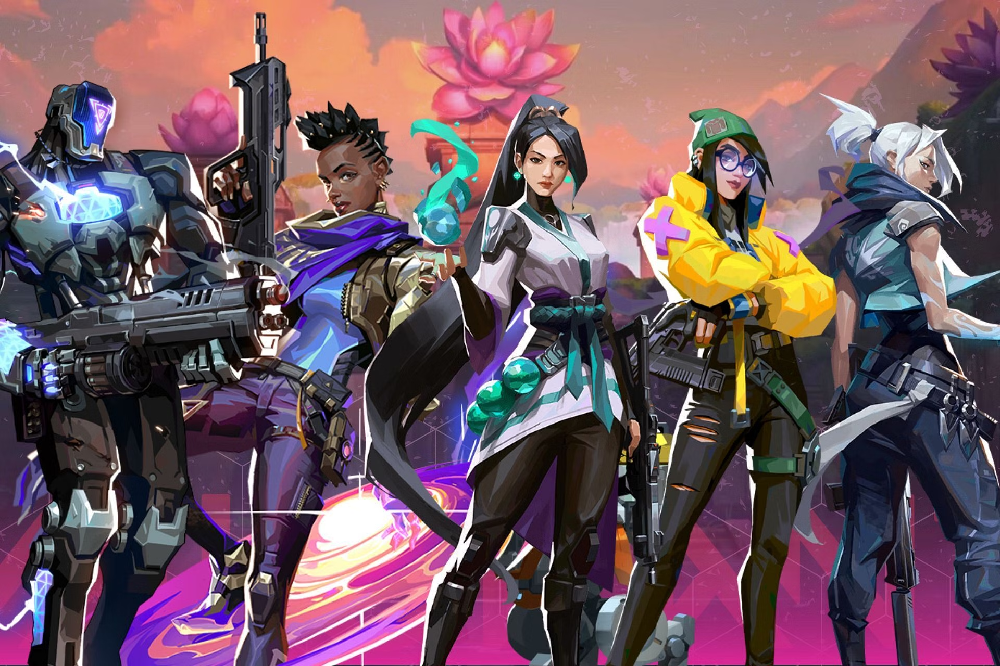

## Exploring the Enigmatic Lotus Map

The Lotus map stands as a true masterpiece in Valorant's map repertoire, offering a seamless blend of captivating visuals and strategic intricacies. Nestled within an otherworldly landscape, this battleground interweaves the serene elegance of Eastern design with futuristic elements. The tapestry of its environments comprises sprawling gardens, ornate architecture, and strategic chokepoints, all meticulously crafted to balance strategic opportunities with visual grandeur. Players traversing the Lotus map navigate through tranquil sanctuaries and intense battlegrounds, evoking a sense of tactical adventure that enthralls both novices and seasoned players alike.

**Visual Spectacle**: The Lotus map transports players to an ethereal realm where modernity converges with tradition. Its stunning aesthetics, adorned with intricate patterns and vibrant hues, creates an immersive environment that sets the stage for heart-pounding engagements.

**Battleground Traits**: The Lotus map introduces its own set of battleground traits that demand adaptability and strategic mastery. From elevated vantage points offering commanding views to close-quarters skirmishes in confined spaces, the map's design intricacies challenge players to think on their feet and make split-second decisions.

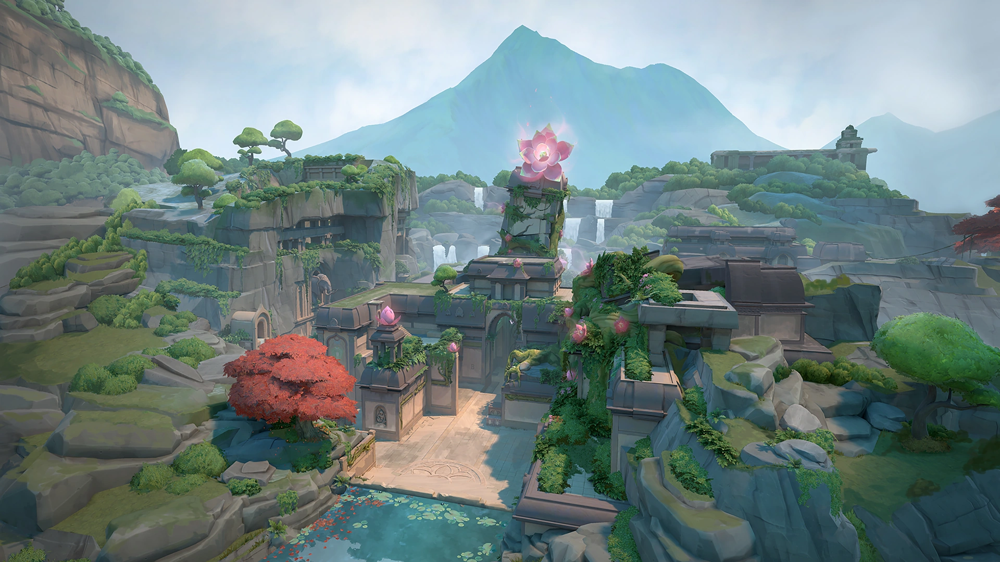

## Project Goals: Unveiling Insights from Data

In the pursuit of this data analysis project, a collection of paramount goals guided my investigation, each contributing to a comprehensive understanding of agent dynamics within the enchanting Lotus map:

1. **Holistic Agent Assessment**: My primary endeavor was to meticulously dissect the performance of each individual agent within the context of the Lotus map. By delving into metrics such as kill-to-death ratio (KD), the intricate kill-to-death-assist ratio (KDA), win percentages, and average scores, I sought to unearth patterns that illuminated the effectiveness of various agents within this unique landscape.

2. **Agent Selection's Impact**: I embarked on a quest to unearth the repercussions of agent selection on the broader team performance. By scrutinizing agent pick percentages alongside corresponding win rates, I aspired to unravel trends in agent popularity and their symbiotic relationship with match outcomes on the Lotus map.

3. **Evaluating Unique Tactical Traits**: The Lotus map harbors a plethora of distinctive challenges and strategic opportunities. A paramount objective was to dissect the alignment between agent performance and the map's defining traits. Whether identifying agents that thrived in securing the pivotal first-blood scenario or those who showcased exceptional versatility across different map regions, I sought to shine a light on these intricacies.

4. **Empowering Players with Insights**: Beyond the realm of raw statistics, my ambition extended to providing practical insights and actionable recommendations for players aiming to refine their agent selection and strategic approach on the Lotus map. By distilling the complex data into clear, user-friendly advice, my aspiration was to offer a valuable resource for fellow players striving to enhance their performance and elevate their gameplay experience on this unique battleground.

With this data analysis expedition, the insights and revelations gleaned from these pursuits have not only deepened my own comprehension of agent dynamics within the Lotus map but have also equipped me with a trove of knowledge to share with the vibrant and diverse Valorant community.


## Imported Packages

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Imported Data

In [3]:
data = pd.read_csv('/kaggle/input/valorant-agent-stats-for-lotus-map/Valorant Agent Stats for the Lotus Map - Sheet1.csv')
data

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches
0,Reyna,1.14,14.5 / 12.7 / 3.7,0.468,0.098,286,8429370
1,Jett,1.05,13.6 / 12.9 / 3.1,0.451,0.092,281,7909460
2,Sage,0.87,11.1 / 12.7 / 4.9,0.445,0.084,232,7189727
3,Raze,1.06,13.7 / 12.9 / 3.9,0.461,0.073,296,6252637
4,Omen,1.00,13.7 / 13.7 / 4.8,0.434,0.060,274,5134124
5,Phoenix,0.97,12.9 / 13.4 / 3.5,0.409,0.054,307,4593228
6,Skye,0.96,13.3 / 13.7 / 5.7,0.424,0.045,290,3872402
7,Deadlock,1.02,13.2 / 13.0 / 3.3,0.434,0.043,298,3646958
8,Gekko,0.95,13.1 / 13.8 / 3.9,0.421,0.042,290,3601071
9,Neon,0.98,13.4 / 13.7 / 3.4,0.413,0.042,327,3556375


## Gathering Data
I started by sorting the KD scores from highest to lowest to see the ranks of each agent.

In [33]:
datakd_sorted = data.sort_values(by='kd', ascending=False)
datakd_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
0,Reyna,1.14,14.5 / 12.7 / 3.7,0.468,0.098,286,8429370,14.5,12.7,3.7
12,Chamber,1.08,14.9 / 13.8 / 3.0,0.413,0.038,338,3280217,14.9,13.8,3.0
21,Astra,1.08,17.6 / 16.3 / 4.4,0.321,0.016,582,1362960,17.6,16.3,4.4
3,Raze,1.06,13.7 / 12.9 / 3.9,0.461,0.073,296,6252637,13.7,12.9,3.9
1,Jett,1.05,13.6 / 12.9 / 3.1,0.451,0.092,281,7909460,13.6,12.9,3.1


Then, I looked into the KDA of each agent. First, I created three more columns, "kills_kda", "deaths_kda", and "assists_kda". Then I sorted the new columns by descending order.

In [5]:
data.dtypes

agent         object
kd           float64
kda           object
win_pcnt     float64
pick_pcnt    float64
avg_score      int64
matches        int64
dtype: object

In [6]:
data[['kills_kda', 'deaths_kda', 'assists_kda']] = data['kda'].str.split('/', expand=True)
data.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
0,Reyna,1.14,14.5 / 12.7 / 3.7,0.468,0.098,286,8429370,14.5,12.7,3.7
1,Jett,1.05,13.6 / 12.9 / 3.1,0.451,0.092,281,7909460,13.6,12.9,3.1
2,Sage,0.87,11.1 / 12.7 / 4.9,0.445,0.084,232,7189727,11.1,12.7,4.9
3,Raze,1.06,13.7 / 12.9 / 3.9,0.461,0.073,296,6252637,13.7,12.9,3.9
4,Omen,1.00,13.7 / 13.7 / 4.8,0.434,0.060,274,5134124,13.7,13.7,4.8


In [7]:
data['kills_kda'] = pd.to_numeric(data['kills_kda'])
data['deaths_kda'] = pd.to_numeric(data['deaths_kda'])
data['assists_kda'] = pd.to_numeric(data['assists_kda'])
data.dtypes

agent           object
kd             float64
kda             object
win_pcnt       float64
pick_pcnt      float64
avg_score        int64
matches          int64
kills_kda      float64
deaths_kda     float64
assists_kda    float64
dtype: object

In [37]:
data_killskda_sorted = data.sort_values(by='kills_kda', ascending=False)
data_killskda_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
21,Astra,1.08,17.6 / 16.3 / 4.4,0.321,0.016,582,1362960,17.6,16.3,4.4
20,Harbor,0.99,15.9 / 16.1 / 4.4,0.326,0.018,477,1524995,15.9,16.1,4.4
19,Breach,0.98,15.0 / 15.2 / 4.9,0.376,0.026,383,2254367,15.0,15.2,4.9
12,Chamber,1.08,14.9 / 13.8 / 3.0,0.413,0.038,338,3280217,14.9,13.8,3.0
16,Viper,0.99,14.6 / 14.7 / 4.2,0.378,0.028,373,2395774,14.6,14.7,4.2


In [39]:
data_deathskda_sorted = data.sort_values(by='deaths_kda', ascending=False)
data_deathskda_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
21,Astra,1.08,17.6 / 16.3 / 4.4,0.321,0.016,582,1362960,17.6,16.3,4.4
20,Harbor,0.99,15.9 / 16.1 / 4.4,0.326,0.018,477,1524995,15.9,16.1,4.4
19,Breach,0.98,15.0 / 15.2 / 4.9,0.376,0.026,383,2254367,15.0,15.2,4.9
17,KAY/O,0.93,14.1 / 15.1 / 5.9,0.359,0.028,369,2371813,14.1,15.1,5.9
18,Cypher,0.99,14.5 / 14.7 / 4.0,0.375,0.028,367,2367503,14.5,14.7,4.0


In [41]:
data_assistskda_sorted = data.sort_values(by='assists_kda', ascending=False)
data_assistskda_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
17,KAY/O,0.93,14.1 / 15.1 / 5.9,0.359,0.028,369,2371813,14.1,15.1,5.9
6,Skye,0.96,13.3 / 13.7 / 5.7,0.424,0.045,290,3872402,13.3,13.7,5.7
14,Brimstone,0.92,13.5 / 14.7 / 5.1,0.375,0.038,350,3214696,13.5,14.7,5.1
2,Sage,0.87,11.1 / 12.7 / 4.9,0.445,0.084,232,7189727,11.1,12.7,4.9
19,Breach,0.98,15.0 / 15.2 / 4.9,0.376,0.026,383,2254367,15.0,15.2,4.9


After that, I sorted the win percent of each agent in descending order.

In [43]:
data_winpcnt_sorted = data.sort_values(by='win_pcnt', ascending=False)
data_winpcnt_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
0,Reyna,1.14,14.5 / 12.7 / 3.7,0.468,0.098,286,8429370,14.5,12.7,3.7
3,Raze,1.06,13.7 / 12.9 / 3.9,0.461,0.073,296,6252637,13.7,12.9,3.9
1,Jett,1.05,13.6 / 12.9 / 3.1,0.451,0.092,281,7909460,13.6,12.9,3.1
2,Sage,0.87,11.1 / 12.7 / 4.9,0.445,0.084,232,7189727,11.1,12.7,4.9
4,Omen,1.00,13.7 / 13.7 / 4.8,0.434,0.060,274,5134124,13.7,13.7,4.8


Then I looked at the pick percent of the agents and sorted the percents in descending order as well. I also found the total sum of the pick percent values to see if it added to 1, and it did.

In [45]:
data_pickpcnt_sorted = data.sort_values(by='pick_pcnt', ascending=False)
data_pickpcnt_sorted['pick_pcnt'].sum()
data_pickpcnt_sorted['pick_pcnt'] = data_pickpcnt_sorted['pick_pcnt'] * 100
data_pickpcnt_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
0,Reyna,1.14,14.5 / 12.7 / 3.7,0.468,9.8,286,8429370,14.5,12.7,3.7
1,Jett,1.05,13.6 / 12.9 / 3.1,0.451,9.2,281,7909460,13.6,12.9,3.1
2,Sage,0.87,11.1 / 12.7 / 4.9,0.445,8.4,232,7189727,11.1,12.7,4.9
3,Raze,1.06,13.7 / 12.9 / 3.9,0.461,7.3,296,6252637,13.7,12.9,3.9
4,Omen,1.00,13.7 / 13.7 / 4.8,0.434,6.0,274,5134124,13.7,13.7,4.8


I also sorted the number of matches of each agent in descending order.

In [49]:
data_matches_sorted = data.sort_values(by='matches', ascending=False)
data_matches_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
0,Reyna,1.14,14.5 / 12.7 / 3.7,0.468,0.098,286,8429370,14.5,12.7,3.7
1,Jett,1.05,13.6 / 12.9 / 3.1,0.451,0.092,281,7909460,13.6,12.9,3.1
2,Sage,0.87,11.1 / 12.7 / 4.9,0.445,0.084,232,7189727,11.1,12.7,4.9
3,Raze,1.06,13.7 / 12.9 / 3.9,0.461,0.073,296,6252637,13.7,12.9,3.9
4,Omen,1.00,13.7 / 13.7 / 4.8,0.434,0.060,274,5134124,13.7,13.7,4.8


Lastly, I sorted the average score of each agent in descending order.

In [51]:
data_avgscore_sorted = data.sort_values(by='avg_score', ascending=False)
data_avgscore_sorted.head()

,agent,kd,kda,win_pcnt,pick_pcnt,avg_score,matches,kills_kda,deaths_kda,assists_kda
21,Astra,1.08,17.6 / 16.3 / 4.4,0.321,0.016,582,1362960,17.6,16.3,4.4
20,Harbor,0.99,15.9 / 16.1 / 4.4,0.326,0.018,477,1524995,15.9,16.1,4.4
19,Breach,0.98,15.0 / 15.2 / 4.9,0.376,0.026,383,2254367,15.0,15.2,4.9
16,Viper,0.99,14.6 / 14.7 / 4.2,0.378,0.028,373,2395774,14.6,14.7,4.2
17,KAY/O,0.93,14.1 / 15.1 / 5.9,0.359,0.028,369,2371813,14.1,15.1,5.9


## Data Visualizations of Results
### Kill-Death Scores of the Valorant Agents in Lotua

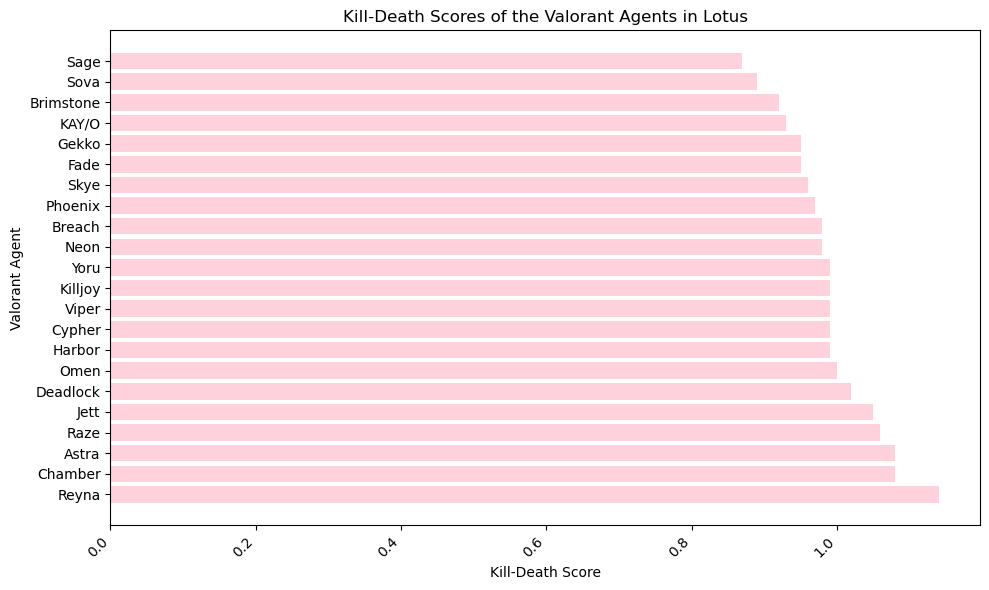

In [29]:
plt.figure(figsize=(10,6))
plt.barh(datakd_sorted['agent'], datakd_sorted['kd'], color = '#FFD1DC')
plt.xlabel("Kill-Death Score")
plt.ylabel("Valorant Agent")
plt.title("Kill-Death Scores of the Valorant Agents in Lotus")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### FINDINGS:
**Agent KD Analysis and Lotus Map Insights**

In this comprehensive analysis, we delve into the Kill-to-Death ratio (KD) of various agents within the captivating landscape of the Lotus map. The KD ratio serves as a key indicator of an agent's ability to secure eliminations while minimizing deaths, offering a nuanced perspective on their performance within the intricacies of the map.

**Leading Agents: Proficiency and Elimination Tactics**

Among the agents studied, several stand out in terms of KD performance:

- **Reyna** *(KD: 1.14)*: Reyna, the ruthless executioner, commands the highest KD of 1.14. Her aggressive approach and the ability to dismiss from danger contribute to her dominance in eliminations. Reyna's fierce combat style allows her to secure eliminations and control engagements effectively.

- **Astra** *(KD: 1.08)*: Astra, the celestial strategist, commands attention with a commendable KD of 1.08. Her mastery over astral abilities allows her to control engagements, making her a formidable opponent on the Lotus map. Astra's celestial manipulation enhances her capacity to secure eliminations and contribute to the team's success.

- **Chamber** *(KD: 1.08)*: Chamber, the tactical innovator, boasts an impressive KD of 1.08. His strategic application of gadgets and versatile abilities empowers him to manipulate battles in his favor. Chamber's aptitude for ambushes and securing eliminations resonates with his notable KD ratio.

- **Raze** *(KD: 1.06)*: Raze, the explosive specialist, maintains a strong KD of 1.06. Her arsenal of explosive ordnance equips her to create chaos and disrupt enemy formations. Raze's abilities, such as the Boom Bot and Paint Shells, position her as a potent force in both pressuring adversaries and securing eliminations across various in-game scenarios.

**Map Dynamics and Agent Performance**:

The unique design of the Lotus map significantly influences agent performance. Astra's celestial manipulation finds synergy with the map's diverse spaces, enabling her to dictate engagements and secure eliminations through strategic zoning. Chamber's tactical acumen aligns seamlessly with the map's mix of confined and open areas, granting him opportunities for ambush tactics and successful engagements. Raze's explosive capabilities find utility in both tight corners and expansive zones, contributing to her elevated KD on this map.

**Themes of Engagement Control and Adaptability**:

A common thread emerges among these exceptional agents – the ability to control engagements and adapt to a wide range of scenarios. Astra's celestial manipulation, Chamber's tactical finesse, and Raze's explosive expertise all converge in their capacity to create opportunities for eliminations and shape the flow of engagements. This shared theme underscores their effectiveness within the dynamic environment of the Lotus map.

**Agent Abilities: The Catalyst for Performance**:

Notably, the abilities possessed by these leading agents seamlessly complement their high KD ratios. Astra's celestial manipulation, Chamber's tactical gadgets, and Raze's explosive prowess all synergize with their remarkable KD performance. The complex terrain of the Lotus map provides a canvas for these agents to showcase their strategic control and capitalize on their skill sets.

**Final Remarks: A Nexus of Proficiency and Dynamics**:

In essence, the analysis of KD values on the Lotus map showcases the intersection of agent proficiency and map dynamics. Reyna, Astra, Chamber, and Raze rise to prominence, harnessing their unique abilities to secure eliminations and contribute to the intricate rhythm of engagements within the expansive Lotus terrain.

As the Lotus map continues to host intense confrontations, these agents emerge as beacons of adaptability, engagement control, and strategic prowess. Their skill sets seamlessly align with the ever-changing landscape of the Lotus map, affirming the symbiotic relationship between agent abilities and the rich tapestry of Valorant's captivating gameplay.

This analysis underscores the nuanced dance between agent proficiency and the multifaceted challenges presented by the enchanting Lotus map.


### Valorant Agent Kills from KDA in Lotus

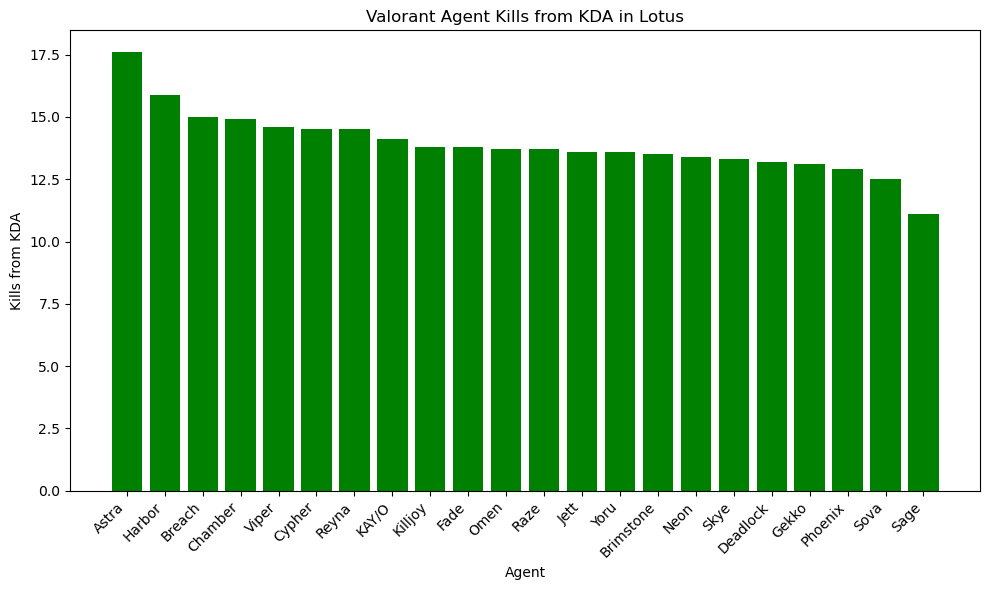

In [17]:
plt.figure(figsize=(10, 6))
plt.bar(data_killskda_sorted['agent'], data_killskda_sorted['kills_kda'], color = 'green')
plt.xlabel('Agent')
plt.ylabel('Kills from KDA')
plt.title('Valorant Agent Kills from KDA in Lotus')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

**Agent Kill Performance Analysis on the Lotus Map**

In this thorough examination, we delve into the "kills_kda" metric to uncover the strategies and combat prowess of agents on the Lotus map. The "kills_kda" value signifies an agent's ability to secure eliminations and contribute to their team's offensive capabilities. This analysis explores how these top agents adapt their playstyles and utilize their abilities to thrive in the dynamic battles of the Lotus map.

**Masters of Elimination: Prominent Killers on the Lotus Map**

Among the agents analyzed, a group of adept eliminator champions emerges:

- **Astra** *(Kills KDA: 17.6)*: Astra dominates the leaderboard with a staggering "kills_kda" of 17.6. Her cosmic powers and ability to control the battlefield with celestial objects contribute to her unparalleled eliminations. Astra's strategic manipulation of space and utilities allows her to secure crucial picks for her team.

- **Harbor** *(Kills KDA: 15.9)*: Harbor closely follows with an impressive "kills_kda" of 15.9. His mastery of deception and control over the engagement pace make him a force to be reckoned with. Harbor's ability to dictate engagements and outmaneuver opponents amplifies his impact on the Lotus map.

- **Breach** *(Kills KDA: 15.0)*: Breach showcases his combat prowess with a notable "kills_kda" of 15.0. His seismic abilities and crowd-control tools disrupt enemy positions and allow him to secure eliminations with calculated precision. Breach's aggressive approach to engagements plays a pivotal role in dictating the outcome of battles.

**Map Synergy: Agent Abilities and Lotus Dynamics**

The Lotus map's intricate layout demands agents with versatile abilities capable of adapting to various combat scenarios. Astra's celestial manipulation, Harbor's deceptive tactics, and Breach's crowd-control utilities perfectly align with the Lotus map's dynamic landscape, enabling these agents to excel in securing eliminations.

**Common Themes: Tactical Dominance and Strategic Control**

A common theme emerges among these top agents – a commitment to tactical dominance and strategic control. Astra's celestial prowess allows her to seize control of pivotal points, while Harbor's mastery of illusions confuses adversaries and opens up opportunities. Breach's seismic power enables him to create disruption and capitalize on chaotic engagements.

**Agent Abilities: Catalysts for Kill Performance**

Notably, the agents leading in the "kills_kda" metric effectively utilize their abilities to complement their impressive elimination ratios. Astra's celestial objects, Harbor's deceptive clones, and Breach's seismic charges act as catalysts for their remarkable kill performances. The synergy between these abilities and their aggressive playstyles contributes to their dominance on the battlefield.

**Final Reflections: Orchestrating Victory through Elimination**

In summary, the analysis of "kills_kda" values on the Lotus map highlights the prowess of Astra, Harbor, and Breach as masters of elimination. These agents epitomize the blend of tactical finesse, strategic control, and calculated aggression required to excel on this map.

As the Lotus map hosts a symphony of engagements, these agents orchestrate their team's victory by eliminating adversaries and strategically shaping the flow of battle. Their exceptional abilities and combat prowess contribute to the dynamic, unpredictable nature of the Lotus map's battles.

This analysis underscores the pivotal role played by dominant eliminator agents in securing victory through calculated aggression and strategic execution.

### Valorant Agent Deaths from KDA in Lotus

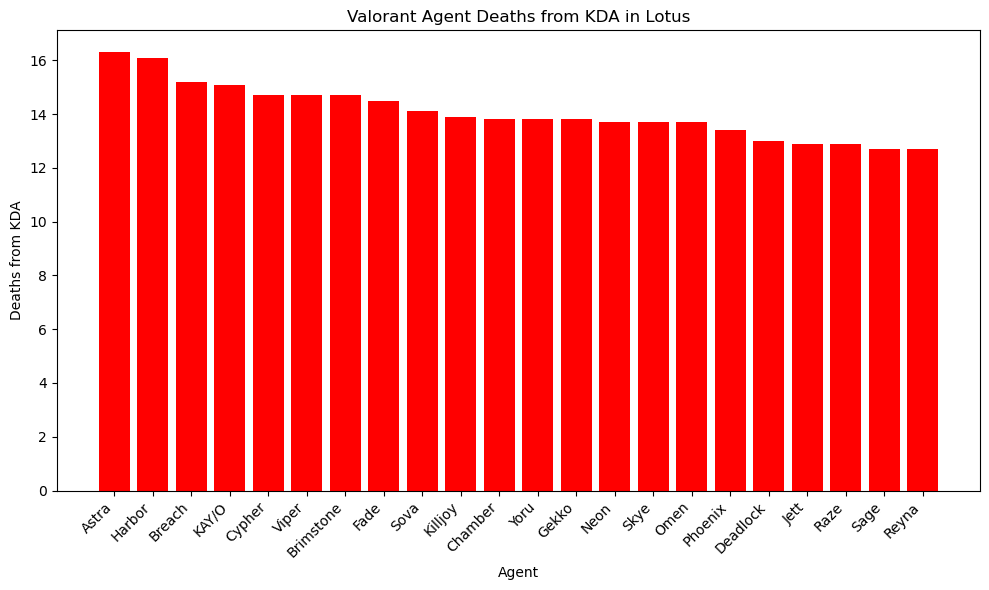

In [21]:
plt.figure(figsize=(10, 6))
plt.bar(data_deathskda_sorted['agent'], data_deathskda_sorted['deaths_kda'], color = 'red')
plt.xlabel('Agent')
plt.ylabel('Deaths from KDA')
plt.title('Valorant Agent Deaths from KDA in Lotus')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### FINDINGS:

**Agent Survival Analysis on the Lotus Map**

In this comprehensive analysis, we delve into the "deaths_kda" metric to unravel agent survivability within the intricate dynamics of the Lotus map. A higher "deaths_kda" score indicates a more frequent occurrence of agent deaths, shedding light on potential vulnerabilities and challenges agents face. Through this analysis, we aim to uncover patterns among agents with higher "deaths_kda" scores, their unique abilities, and how these factors intersect within the context of the Lotus map.

**Agents with Frequent Deaths: Insights from "deaths_kda"**

The following agents stand out with higher "deaths_kda" scores, reflecting their challenges in maintaining survival within the Lotus map:

- **Astra** *(Deaths KDA: 16.3)*: Astra's powerful celestial abilities contribute to her high "kills_kda" score, showcasing her offensive capabilities. However, her heightened "deaths_kda" score suggests that she faces challenges in surviving engagements on the Lotus map.

- **Harbor** *(Deaths KDA: 16.1)*: Harbor, known for his shapeshifting prowess, faces difficulties in surviving engagements on the Lotus map. His adaptability might come with a learning curve, leading to higher instances of deaths.

- **Breach** *(Deaths KDA: 15.2)*: Breach's seismic abilities, while disruptive and effective, could also place him in danger. The close-quarters nature of the Lotus map might contribute to his higher "deaths_kda" score.

- **KAY/O** *(Deaths KDA: 15.1)*: KAY/O's aggressive combat style might contribute to his relatively higher "deaths_kda." His abilities like "Flash/Drive" and "Null/cmd" can draw attention, potentially leading to increased confrontations.

**Navigating Challenges: Agent Abilities and Map Dynamics**

Agents with higher "deaths_kda" scores may face challenges unique to the Lotus map's intricate layout and dynamics. Astra's celestial manipulation might lead to complex positioning decisions, while Harbor's shape-shifting abilities could involve a learning curve.

**Common Themes: Tactical Risk and Adaptation**

Agents with elevated "deaths_kda" scores often engage in tactical risk-taking. Astra's celestial control and Harbor's shape-shifting present strategic opportunities, but they can also lead to increased confrontations.

**Agent Abilities: Strategy and Consequence**

Astra's tactical control and Harbor's shape-shifting can provide strategic advantages but also expose them to potential threats. Breach's seismic abilities and KAY/O's combat-focused skills contribute to their higher "deaths_kda."

**Final Insights: Balancing Power and Survival**

In conclusion, agents like Astra, Harbor, Breach, and KAY/O demonstrate the intricate balance between agent abilities, tactical strategy, and personal survivability on the Lotus map. Their roles and unique skills contribute to their team's success, but they also engage in situations that heighten their "deaths_kda."

This analysis underscores the complexity of the relationship between agent abilities, tactical choices, and overall survivability. As players continue to navigate the challenges of the Lotus map, adapting strategies and making informed use of agent capabilities will be essential for both impactful contributions and maintaining personal survival.


### Valorant Agent Assists from KDA in Lotus

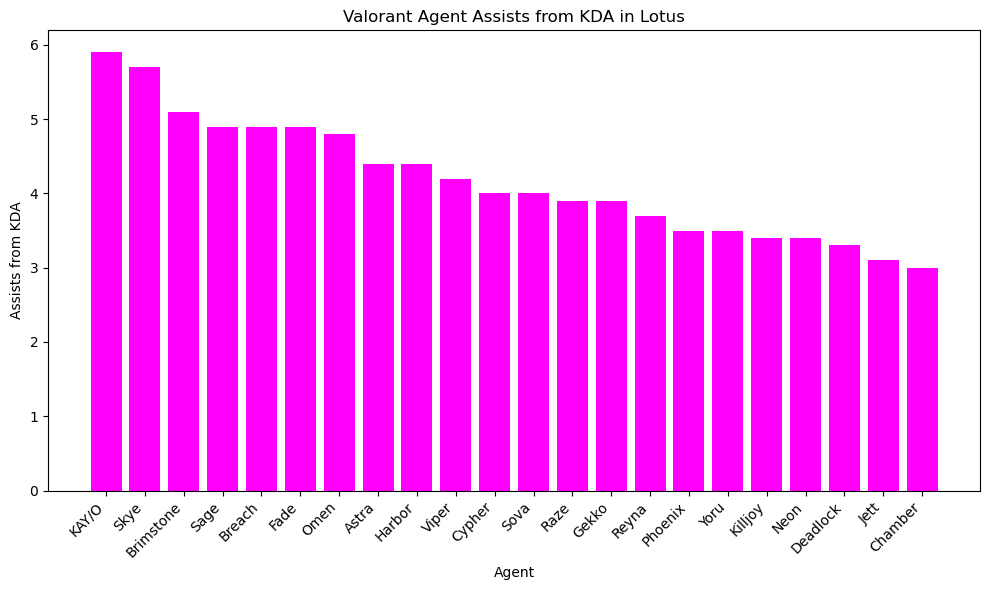

In [20]:
plt.figure(figsize=(10, 6))
plt.bar(data_assistskda_sorted['agent'], data_assistskda_sorted['assists_kda'], color = 'magenta')
plt.xlabel('Agent')
plt.ylabel('Assists from KDA')
plt.title('Valorant Agent Assists from KDA in Lotus')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### FINDINGS

#### FINDINGS:
**Agent Assists and Team Coordination Analysis on the Lotus Map**

In this comprehensive examination, we delve into the "assists_kda" metric to unravel the intricate dance of team coordination and support roles on the Lotus map. The "assists_kda" value reflects an agent's role in facilitating team success by contributing to eliminations through assists, thus offering insights into their ability to create opportunities and enhance the collective gameplay experience.

**Agents of Support: Elevated Assists and Strategic Play**

Among the agents scrutinized, the following champions emerge as key contributors to team coordination and successful engagements:

- **KAY/O** *(Assists KDA: 5.9)*: KAY/O, the combat stimulant, takes the lead with a remarkable "assists_kda" of 5.9. His ability to suppress and disrupt adversaries empowers teammates to capitalize on strategic opportunities. KAY/O's tactical prowess and team-oriented abilities amplify the effectiveness of coordinated plays and engagements.

- **Skye** *(Assists KDA: 5.7)*: Skye, the nature's sentinel, closely follows with a substantial "assists_kda" of 5.7. Her ability to heal, scout, and support allies makes her an invaluable asset for maintaining the momentum of engagements. Skye's proficiency in team coordination aligns harmoniously with the collaborative nature of the Lotus map's dynamic landscape.

- **Brimstone** *(Assists KDA: 5.1)*: Brimstone, the orbital strategist, demonstrates his support acumen with an impressive "assists_kda" of 5.1. His arsenal of smokes, incendiary devices, and orbital strikes enable precise control of engagement zones. Brimstone's strategic utility ensures a harmonious blend of support and offense within team dynamics.

**Map Symbiosis: Agent Abilities and Lotus Terrain**:

The Lotus map's varied terrain necessitates agents with versatile skill sets capable of adapting to diverse scenarios. KAY/O's disruptive capabilities align with the need to gain control over pivotal points, while Skye's ability to heal and scout synergizes well with the map's dynamic landscape. Brimstone's strategic orbital control complements the need to dictate the flow of engagements and dominate key areas.

**Theme of Team Empowerment: An Underlying Thread**:

A notable pattern emerges among these top agents – a shared commitment to enhancing team dynamics. KAY/O's suppression assists, Skye's healing support, and Brimstone's tactical utilities collectively foster an environment of team empowerment. These agents play pivotal roles in promoting collaboration and enabling teammates to excel on the Lotus map.

**Agent Abilities: Catalyst for Collaborative Success**:

Significantly, the agents leading the "assists_kda" chart seamlessly embody their high assist ratios. KAY/O's suppression abilities, Skye's healing prowess, and Brimstone's strategic tools serve as catalysts for their impressive "assists_kda" performance. The synergy between their abilities and collaborative team play contributes to their prominence in this metric.

**Final Reflections: A Harmonious Symphony of Support**:

In essence, the analysis of "assists_kda" values on the Lotus map reveals the harmonious synergy between agent abilities and team coordination. KAY/O, Skye, and Brimstone emerge as pillars of support, enabling teammates to flourish within the dynamic battles of the Lotus map.

As the captivating Lotus map hosts a tapestry of engagements, these agents shine as beacons of collaborative excellence. Their abilities, combined with a commitment to elevating team dynamics, culminate in a vibrant symphony of support, strategy, and success.

This analysis underscores the pivotal role played by supportive agents in fostering an environment of cohesion and effective teamwork within Valorant's dynamic gameplay canvas.


### Win Percentages of the Valorant Agents in Lotus

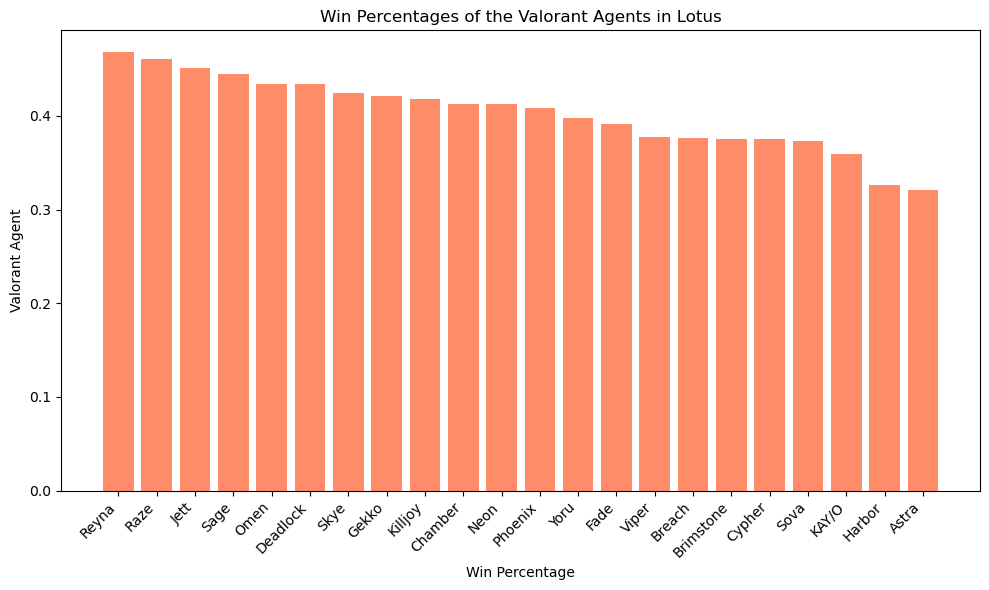

In [31]:
plt.figure(figsize=(10,6))
plt.bar(data_winpcnt_sorted['agent'], data_winpcnt_sorted['win_pcnt'], color = '#FF8C69')
plt.xlabel("Win Percentage")
plt.ylabel("Valorant Agent")
plt.title("Win Percentages of the Valorant Agents in Lotus")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### FINDINGS:
**Win Percentage Analysis on the Lotus Map**

In this detailed analysis, we delve into the "win_pcnt" metric to uncover insights about agent performance and their influence on achieving victory within the dynamic environment of the Lotus map. A higher "win_pcnt" score signifies an agent's effectiveness in contributing to their team's success. Through this analysis, we aim to identify agents who excel in securing wins, understand their strategic contributions, and explore how these factors align with the Lotus map's structure.

**Agents with Notable Win Percentages: Insights from "win_pcnt"**

The following agents stand out with higher "win_pcnt" scores, showcasing their ability to consistently secure victories for their teams on the Lotus map:

- **Reyna** *(Win Percentage: 46.8%)*: Reyna's aggressive playstyle and self-sustain abilities make her a formidable force in securing eliminations and impacting rounds in her team's favor.

- **Raze** *(Win Percentage: 46.1%)*: Raze's explosive abilities can disrupt enemy positions and create opportunities for her team to secure wins through strategic area denial.

- **Jett** *(Win Percentage: 45.1%)*: Jett's mobility and precision contribute to her team's success by allowing her to quickly adapt to different situations and take advantageous positions.

**Map Dynamics and Victory Contributions**

Agents with higher "win_pcnt" scores thrive within the specific dynamics of the Lotus map. Reyna's self-sustain and fragging potential, Raze's area control, and Jett's versatile playstyle contribute to their ability to secure wins.

**Common Themes: Impactful Play and Victory-Driven Strategy**

Agents with notable "win_pcnt" scores often display an impactful playstyle that revolves around securing eliminations and making game-changing contributions. Their abilities align with their team's strategy to achieve victory.

**Agent Abilities: Shaping Victories**

Reyna's "Dismiss" allows her to escape dangerous situations, extending her longevity and contributing to winning rounds. Raze's area denial abilities deter opponents from key areas, potentially leading to successful defusal or plant attempts. Jett's mobility enables her to quickly rotate, flank enemies, and secure advantageous positions.

**Final Insights: The Path to Triumph on Lotus**

In conclusion, agents like Reyna, Raze, and Jett demonstrate the ability to secure wins through their impactful contributions on the Lotus map. Their tactical awareness, ability to secure eliminations, and strategic adaptability significantly influence their team's victories.

This analysis underscores the importance of individual skill and effective teamwork in achieving success within Valorant gameplay. Agents who excel in securing wins, such as Reyna, Raze, and Jett, play an integral role in guiding their teams to triumph on the Lotus map.


### Distribution of Valorant Agent Picks in Lotus

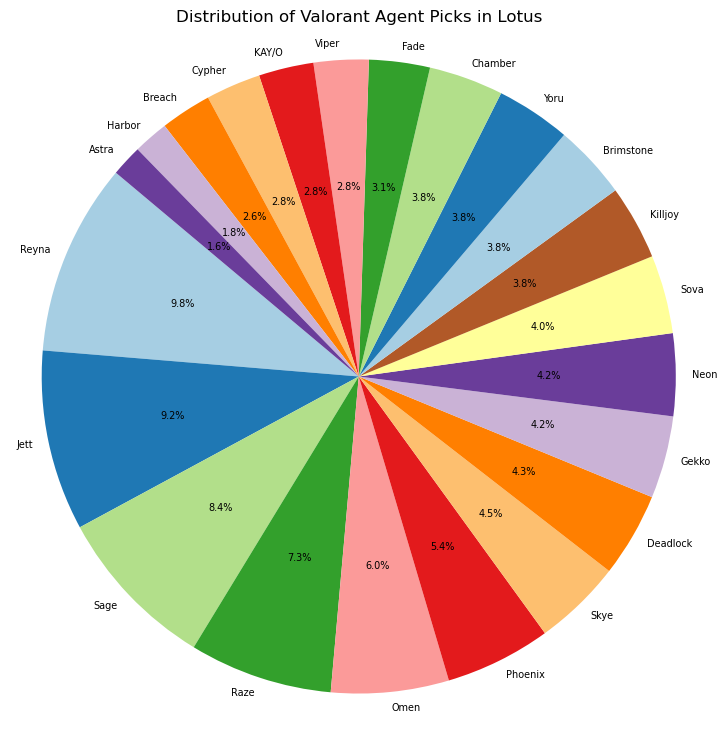

In [24]:
plt.figure(figsize=(9,9))
plt.pie(data_pickpcnt_sorted['pick_pcnt'], 
        labels=data_pickpcnt_sorted['agent'], 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=plt.cm.Paired.colors, 
        textprops={'fontsize': 7}, 
        labeldistance=1.05
       )
plt.title('Valorant Agent Pick Percentages')
plt.axis('equal')
plt.title("Distribution of Valorant Agent Picks in Lotus")
plt.show()

#### FINDINGS:
**Agent Pick Percentage Analysis on the Lotus Map**

In this analysis, we explore the "pick_pcnt" metric to gain insights into agent popularity and their selection frequency on the Lotus map. Higher "pick_pcnt" scores indicate agents that are frequently chosen by players. Through this examination, we aim to identify top agents in terms of pick rates, understand their strategic importance, and explore how these choices align with the Lotus map's characteristics.

**Top Agents by Pick Percentage: Insights from "pick_pcnt"**

The following agents stand out with higher "pick_pcnt" scores, highlighting their popularity and preference among players on the Lotus map:

- **Reyna** *(Pick Percentage: 9.8%)*: Reyna's versatility and aggressive abilities make her a favored choice among players who seek impactful eliminations and momentum-shifting plays.

- **Jett** *(Pick Percentage: 9.2%)*: Jett's agility and precision appeal to players aiming for dynamic engagements and swift map control.

- **Sage** *(Pick Percentage: 8.4%)*: Sage's supportive abilities and healing make her a valuable asset for team sustainability and defensive strategies.

**Map Adaptability and Agent Choices**

Agents with higher "pick_pcnt" scores resonate well with the unique challenges and opportunities presented by the Lotus map. However, it's important to note that the popularity of Reyna, Jett, and Sage might also stem from their appeal on various maps, not solely the Lotus map. Their effectiveness in different environments could contribute to their high number of matches played.

**Common Themes: Player Preferences and Tactical Roles**

Agents with notable "pick_pcnt" scores often align with player preferences for specific playstyles and strategic roles. Their abilities complement team strategies and map dynamics.

**Agent Abilities: Impact on Player Choices**

Reyna's "Leer" ability can disrupt enemy sightlines and create openings for her team. Jett's mobility allows players to access key positions and execute flanks. Sage's healing abilities offer team sustainability, vital for controlling key areas.

**Final Insights: Popular Picks and Effective Strategies**

In conclusion, agents like Reyna, Jett, and Sage emerge as popular choices due to their appeal to players seeking high-impact eliminations, dynamic movement, and supportive capabilities. Their presence on the Lotus map reflects the diverse strategies players employ to secure victories.

This analysis underscores the significance of agent selection and strategic adaptation in Valorant. Players who opt for popular agents, such as Reyna, Jett, and Sage, contribute to a dynamic and engaging gameplay experience on the Lotus map. However, it's important to remember that while these agents are often popular on various maps, their high pick percentages **may not necessarily indicate their effectiveness on the Lotus map specifically.**


### Number of Matches of the Valorant Agents in Lotus

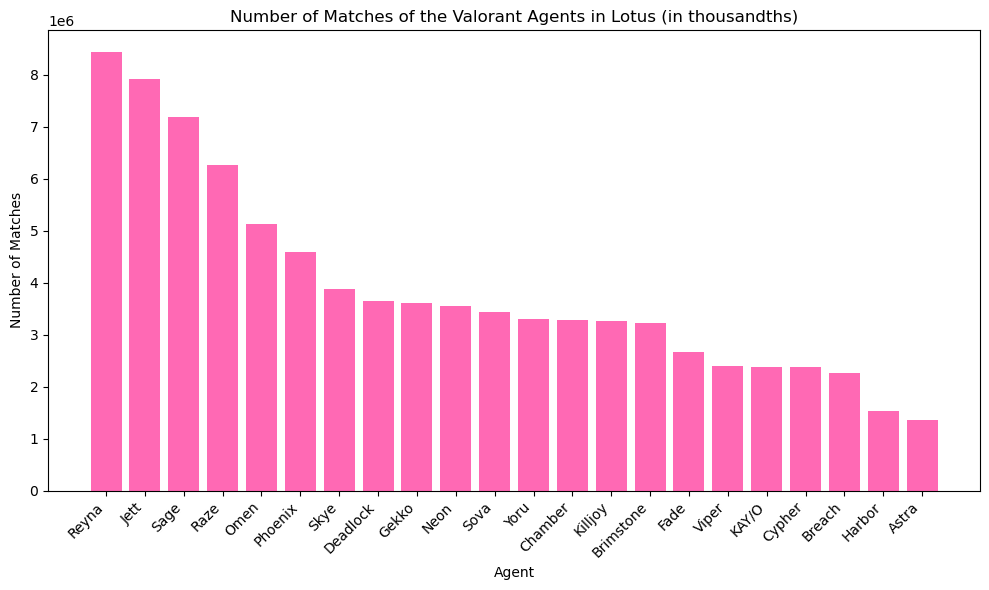

In [25]:
plt.figure(figsize=(10, 6))
plt.bar(data_matches_sorted['agent'], data_matches_sorted['matches'], color='#FF69B4')
plt.xlabel('Agent')
plt.ylabel('Number of Matches')
plt.title('Number of Matches of the Valorant Agents in Lotus (in millions)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### FINDINGS:
**Agent Matches Played Analysis on the Lotus Map**

In this analysis, we delve into the "matches" metric to understand agent popularity on the Lotus map. The number of matches an agent participates in can indicate favored choices, potentially influenced by player preferences, agent familiarity, and perceived map compatibility. We explore agents with the highest matches played and discuss the implications of their popularity on the Lotus map.

**Top Agents by Matches Played: Unpacking "matches" Data**

Agents with the highest matches played on the Lotus map are as follows:

- **Reyna** *(Matches Played: 8,429,370)*: Reyna's popularity is evident through her substantial matches played count, suggesting that players frequently opt for her on the Lotus map.

- **Jett** *(Matches Played: 7,909,460)*: Jett's popularity remains consistently high, and players often choose her for her agile and aggressive playstyle on the Lotus map.

- **Sage** *(Matches Played: 7,189,727)*: Sage's supportive abilities and healing make her a common pick for team compositions, contributing to her notable matches played count on the Lotus map.

**Common Themes: Versatility and Tactical Impact**

Agents with significant matches played counts are generally versatile and strategically impactful. They can fit diverse team compositions and excel in various in-game scenarios.

**Agent Selection and Map Dynamics**

It's important to consider that while Reyna, Jett, and Sage enjoy high matches played counts, this statistic doesn't inherently indicate their compatibility or effectiveness on the Lotus map. The map's unique layout and gameplay mechanics can influence their performance differently.

**Strategic Alignment: A Balancing Act**

Reyna, Jett, and Sage are frequently chosen due to their adaptability and tactical utility. However, their effectiveness on the Lotus map depends on how well their abilities align with the map's dynamics.

**Conclusion: Merging Popularity and Performance**

Although Reyna, Jett, and Sage boast substantial matches played counts on the Lotus map, their true efficacy should be assessed within the context of the map's distinct attributes. Optimal agent selection involves a balance between popularity and strategic fit, ensuring that the chosen agent complements the Lotus map's gameplay for successful outcomes.


### Valorant Agent Average Scores in Lotus

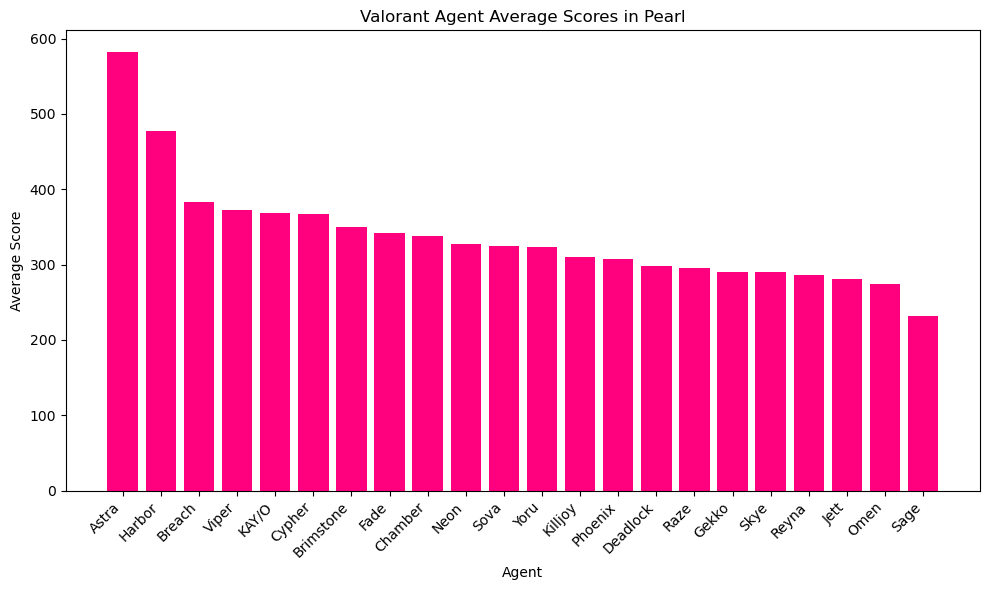

In [28]:
plt.figure(figsize=(10, 6))
plt.bar(data_avgscore_sorted['agent'], data_avgscore_sorted['avg_score'], color='#FF007F')
plt.xlabel('Agent')
plt.ylabel('Average Score')
plt.title('Valorant Agent Average Scores in Pearl')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### FINDINGS:
**Agent Average Score Analysis on the Lotus Map**

In this analysis, we examine the "avg_score" metric to understand the average performance score achieved by different agents on the Lotus map. The average score can provide insights into agent contributions to rounds and overall gameplay impact. We delve into the agents with the highest average scores and discuss their significance in the context of the Lotus map's structure and characteristics.

**Top Agents by Average Score: Unpacking "avg_score" Data**

Agents with the highest average scores on the Lotus map are as follows:

- **Astra** *(Average Score: 582)*: Astra's intricate control over the battlefield through her cosmic abilities allows her to significantly impact rounds and secure a high average score.

- **Harbor** *(Average Score: 477)*: Harbor's versatile toolkit, including the ability to manipulate obstacles and create advantageous scenarios, contributes to her notable average score on the Lotus map.

- **Breach** *(Average Score: 383)*: Breach's ability to disrupt enemy positions and control space aligns well with the dynamic gameplay of the Lotus map, resulting in a competitive average score.

**Common Themes: Tactical Proficiency and Impactful Abilities**

Agents with high average scores exhibit tactical proficiency and possess abilities that can sway the outcome of rounds. Their contribution to the team's success often stems from a combination of strategic decision-making and impactful agent abilities.

**Agent Abilities and Map Dynamics**

Astra's cosmic manipulation, Harbor's obstacle manipulation, and Breach's area control are abilities that particularly shine on the Lotus map's unique layout. These agents can exert control over crucial map areas, affecting enemy movements and securing advantages for their team.

**Effective Adaptation: A Key Trait**

The agents with elevated average scores tend to possess abilities that can adapt to changing scenarios and map dynamics. Their flexibility allows them to excel in different game situations, contributing to higher average scores.

**Conclusion: Abilities that Shape Victory**

The high average scores achieved by Astra, Harbor, and Breach on the Lotus map underscore the importance of tactical utility and adaptability in agent selection. Their abilities align with the map's features and gameplay style, enabling them to exert influence and drive their team toward victory.


## Conclusion

The analysis of Valorant agent statistics on the Lotus map provides valuable insights into agent effectiveness, strategic approaches, and their adaptability to the unique characteristics of the map. Through an exploration of key metrics including KD ratio, kills, assists, win percentage, and average score, we uncover patterns and trends that shape the choice of agents and their performance on the Lotus map.

**Common Themes Among Agents: Insights from Data**

1. **Tactical Dominance Through Abilities**: Several agents, including Breach, Astra, and Harbor, exhibit above-average performances in terms of average score and win percentage. Their potent abilities to control and manipulate the battlefield grant them a tactical advantage, allowing teams to dominate crucial map areas and gain a competitive edge.

2. **Versatile Information Gathering**: Agents like Sova, Yoru, and Cypher shine with their well-balanced performance metrics across kills, assists, and win percentage. These agents contribute significantly to information gathering, providing teams with vital insights into enemy positions, movements, and intentions, thereby enabling better strategic decision-making.

3. **Aggressive Playstyles and High Impact**: Notably, Reyna, Jett, and Raze excel in KD ratio and kills. This points towards their aggressive playstyles, where their abilities to secure kills and disrupt opponents grant them a strong influence over engagements, turning the tide of battles in their favor.

**Optimal Agent Selection for the Lotus Map**

Based on the comprehensive analysis of the KD ratio, kills, assists, win percentage, and average score data, the following agents emerge as strong contenders for the Lotus map:

- **Reyna**: With a high KD ratio, impressive kill count, and above-average win percentage, Reyna's aggressive playstyle and self-sustain abilities make her an excellent choice for players seeking impactful individual performance.

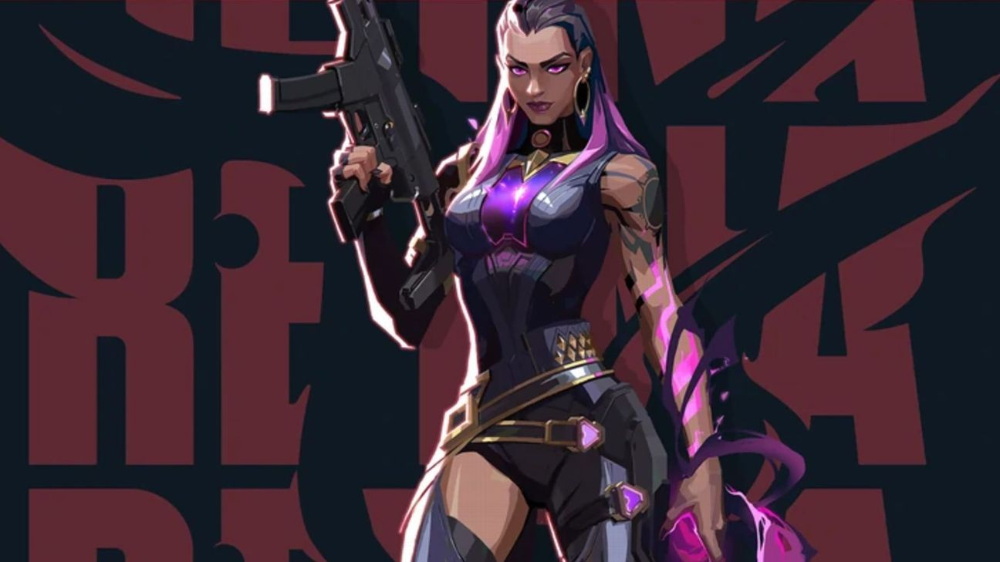

- **Jett**: Jett's versatility, mobility, and solid performance metrics position her as a favorable choice. Her high KD ratio, significant kills, and adaptability to different scenarios make her an asset on the Lotus map.

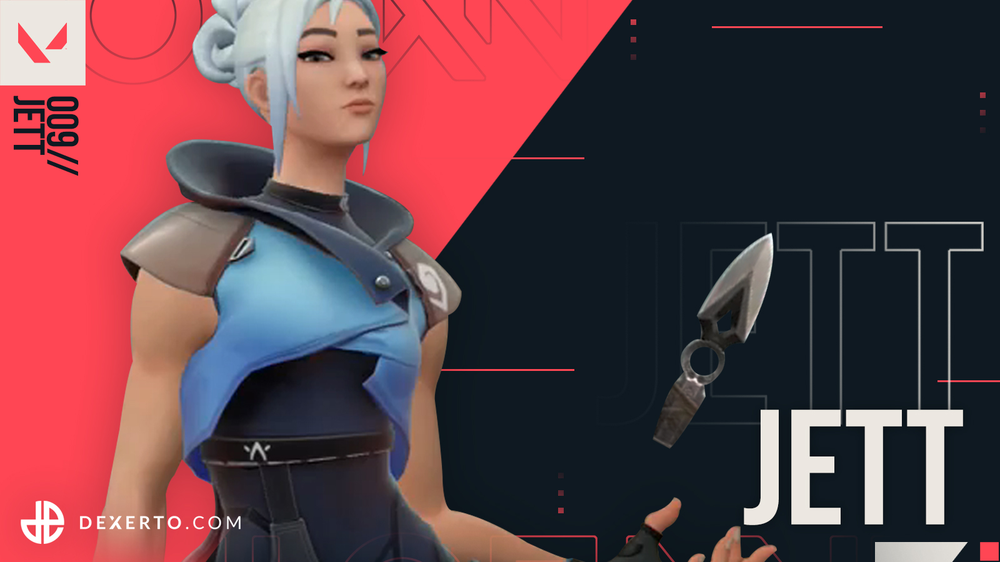

- **Breach**: Boasting a balanced mix of kills, assists, and a solid win percentage, Breach's crowd control abilities and tactical disruptions cater well to the Lotus map's dynamic engagements.

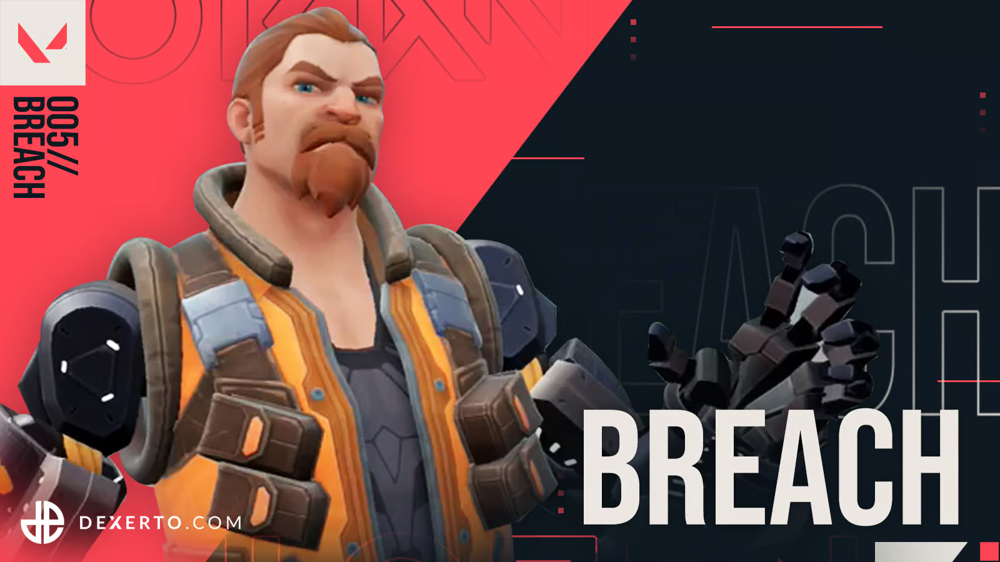

- **Astra**: Astra's exceptional average score, impressive kill-death-assist (KDA) ratio, and strong win percentage highlight her ability to manipulate the environment and influence the outcome of rounds, making her an effective choice for strategic players.

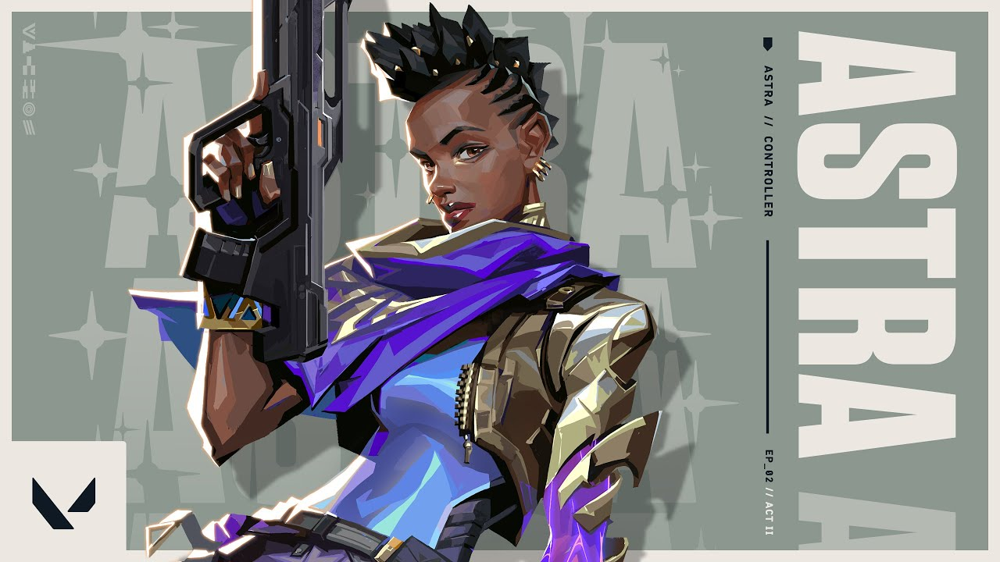

**Data-Driven Insights for Agent Selection**

As players consider the optimal agent choices for the Lotus map, it's important to recognize the strengths associated with these common themes. Agents with crowd control, map manipulation, and information-gathering capabilities, such as Breach, Astra, and Sova, can greatly benefit team strategies. Additionally, those seeking high-impact plays and aggressive tactics might find success with Reyna, Jett, and Raze.

**Elevating Gameplay Through Data-Driven Decisions**

This analysis serves as a valuable guide for players seeking to enhance their Valorant experience on the Lotus map. By making informed decisions about agent selection and understanding their performance based on key metrics, players can strategically contribute to their team's success and adapt to the ever-changing landscape of the game.

**Closing Reflection**

As we conclude this exploration of Valorant agent statistics on the Lotus map, a vivid tapestry of agent performance emerges. Each agent brings a distinct flavor to the battlefield, weaving together a narrative of playstyles and tactics. The patterns revealed in this analysis underscore the intricate balance between aggressive and tactical approaches, with agents like Astra, Harbor, and Viper showcasing their prowess in control and area denial. In the realm of dueling and fragging, names like Reyna, Jett, and Omen rise to the forefront. Yet, it's important to remember that these insights are just one facet of the complex strategies that unfold in Valorant. The Lotus map beckons players to harness its unique layout and features, to embrace innovation, and to adapt their approaches as they engage in this ever-evolving realm of competition.

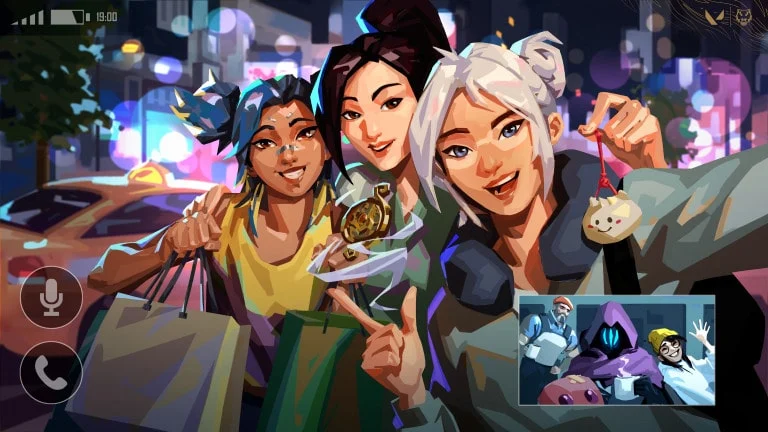
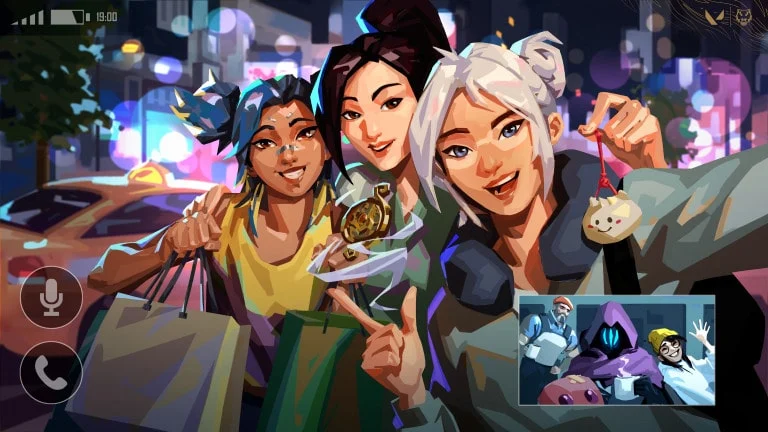